In [2]:
%pwd

'd:\\RAG\\RAG_Final_Project\\RAG_based_Research_Assistant\\research'

In [1]:
%pwd

'd:\\RAG\\RAG_Final_Project\\RAG_based_Research_Assistant\\research'

In [2]:
import os 
os.chdir('../')

In [5]:
%pwd

'd:\\RAG\\RAG_Final_Project\\RAG_based_Research_Assistant'

In [49]:
import json
from typing import List
from pathlib import Path
# Unstructured for document parsing
from unstructured.partition.pdf import partition_pdf
from unstructured.chunking.title import chunk_by_title
# LangChain components
from langchain_core.documents import Document
from langchain_huggingface import HuggingFaceEmbeddings 
from groq import Groq
import torch
import os
from langchain_chroma import Chroma
from langchain_core.messages import HumanMessage
from dotenv import load_dotenv

load_dotenv()

True

In [6]:
def partition_document(file_path: str):
    """Extract elements from PDF using unstructured"""
    print(f"📄 Partitioning document: {file_path}")
    
    elements = partition_pdf(
        filename=file_path,  # Path to your PDF file
        strategy="hi_res", # Use the most accurate (but slower) processing method of extraction
        infer_table_structure=True, # Keep tables as structured HTML, not jumbled text
        extract_image_block_types=["Image"], # Grab images found in the PDF
        extract_image_block_to_payload=True # Store images as base64 data you can actually use
    )
    
    print(f"✅ Extracted {len(elements)} elements")
    return elements


yedi auta matra pdf partition gareko vaye , it would look like this 

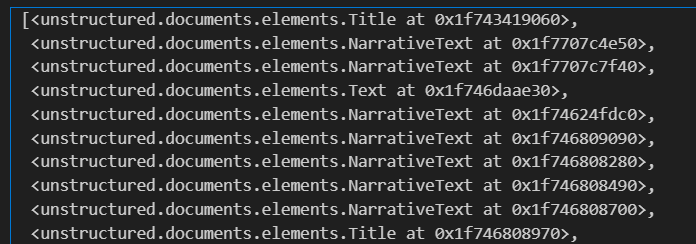

In [7]:
def partition_documents_from_folder(folder_path: str, file_extension: str = ".pdf"):
    """
    Process all documents from a folder
    
    Args:
        folder_path: Path to folder containing documents
        file_extension: File extension to filter (default: .pdf)
    
    Returns:
        Dictionary mapping filename to extracted elements
    """
    folder = Path(folder_path)
    
    # Find all PDF files in the folder
    pdf_files = list(folder.glob(f"*{file_extension}"))    # folder.glob('*.pdf')
    
    if not pdf_files:
        print(f"⚠️  No {file_extension} files found in {folder_path}")
        return {}
    
    print(f"📁 Found {len(pdf_files)} PDF files in {folder_path}")
    print("-" * 50)
    
    all_elements = {}
    
    for pdf_file in pdf_files:
        try:
            elements = partition_document(str(pdf_file))
            all_elements[pdf_file.name] = elements
            print(f"✓ Successfully processed: {pdf_file.name}")
            print("-" * 50)
        except Exception as e:
            print(f"❌ Error processing {pdf_file.name}: {str(e)}")
            print("-" * 50)
            continue
    
    print(f"\n🎉 Successfully processed {len(all_elements)}/{len(pdf_files)} documents")
    return all_elements

In [52]:
def flatten_all_elements(elements_dict: dict) -> list:
    """
    Flatten all elements from multiple documents into a single list
    Useful for creating a unified vector store
    
    Args:
        elements_dict: Dictionary mapping filename to elements
    
    Returns:
        List of all elements with source metadata
    """
    flattened = []
    
    for filename, elements in elements_dict.items():
        for element in elements:
            # Unstructured elements have immutable metadata
            # We can set the filename attribute directly
            if hasattr(element, 'metadata') and hasattr(element.metadata, 'filename'):
                element.metadata.filename = filename
            flattened.append(element)
    
    return flattened

In [8]:
from pathlib import Path

In [10]:
data_folder = "./data"
elements_by_doc = partition_documents_from_folder(data_folder)


📁 Found 9 PDF files in ./data
--------------------------------------------------
📄 Partitioning document: data\6th_paper.pdf


The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


✅ Extracted 260 elements
✓ Successfully processed: 6th_paper.pdf
--------------------------------------------------
📄 Partitioning document: data\bandai_and_ghezzel.pdf
✅ Extracted 462 elements
✓ Successfully processed: bandai_and_ghezzel.pdf
--------------------------------------------------
📄 Partitioning document: data\dahal_etal.pdf
✅ Extracted 342 elements
✓ Successfully processed: dahal_etal.pdf
--------------------------------------------------
📄 Partitioning document: data\hasegawa_etal.pdf
✅ Extracted 276 elements
✓ Successfully processed: hasegawa_etal.pdf
--------------------------------------------------
📄 Partitioning document: data\Integration of Physics-Informed Neural Networks and Transfer Lear.pdf


Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]


✅ Extracted 166 elements
✓ Successfully processed: Integration of Physics-Informed Neural Networks and Transfer Lear.pdf
--------------------------------------------------
📄 Partitioning document: data\mondini_etal.pdf


Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-strok

Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-stroke color because expected 3 components but got [1]
Cannot set non-strok

✅ Extracted 348 elements
✓ Successfully processed: mondini_etal.pdf
--------------------------------------------------
📄 Partitioning document: data\pomarico_etal.pdf
✅ Extracted 104 elements
✓ Successfully processed: pomarico_etal.pdf
--------------------------------------------------
📄 Partitioning document: data\ranjan_etal.pdf
✅ Extracted 125 elements
✓ Successfully processed: ranjan_etal.pdf
--------------------------------------------------
📄 Partitioning document: data\tarullo_etal.pdf
✅ Extracted 75 elements
✓ Successfully processed: tarullo_etal.pdf
--------------------------------------------------

🎉 Successfully processed 9/9 documents


In [11]:
all_elements = flatten_all_elements(elements_by_doc)
print(f"\n📊 Total elements across all documents: {len(all_elements)}")


📊 Total elements across all documents: 2158


In [12]:
elements_by_doc

{'6th_paper.pdf': [<unstructured.documents.elements.Image at 0x2cacacb4af0>,
 'bandai_and_ghezzel.pdf': [<unstructured.documents.elements.NarrativeText at 0x2cacdd6c190>,
 'dahal_etal.pdf': [<unstructured.documents.elements.Header at 0x2cadabb5030>,
 'hasegawa_etal.pdf': [<unstructured.documents.elements.Image at 0x2cad7843cd0>,
 'Integration of Physics-Informed Neural Networks and Transfer Lear.pdf': [<unstructured.documents.elements.Image at 0x2cad8a84f40>,
 'mondini_etal.pdf': [<unstructured.documents.elements.Text at 0x2cadaafcd30>,
 'pomarico_etal.pdf': [<unstructured.documents.elements.Image at 0x2cadb7f1780>,
 'ranjan_etal.pdf': [<unstructured.documents.elements.NarrativeText at 0x2cadac55030>,
 'tarullo_etal.pdf': [<unstructured.documents.elements.Image at 0x2cadac546a0>,
  <unstructured.documents.elements.NarrativeText at 0x2cadad82290>]}

In [13]:
all_elements

 ...]

In [12]:
len(all_elements)

2158

In [ ]:
all_elements[0]

In [14]:
all_elements[0].to_dict()

{'type': 'Image',
 'element_id': '34aa192a59554dbfc075abac90e031ab',
 'text': '® Check for updates',
 'metadata': {'coordinates': {'points': ((np.float64(1458.1944444444446),
     np.float64(0.002794053888995525)),
    (np.float64(1458.1944444444446), np.float64(41.66946072055566)),
    (np.float64(1669.3055555555557), np.float64(41.66946072055566)),
    (np.float64(1669.3055555555557), np.float64(0.002794053888995525))),
   'system': 'PixelSpace',
   'layout_width': 1670,
   'layout_height': 2189},
  'last_modified': '2026-01-13T23:13:27',
  'filetype': 'application/pdf',
  'languages': ['eng'],
  'page_number': 1,
  'image_base64': '/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAAqANMDASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2Jyg

In [15]:
%pwd

'd:\\RAG\\RAG_Final_Project\\RAG_based_Research_Assistant'

In [16]:
# Save to disk
import pickle
with open('cache/elements_cache.pkl', 'wb') as f:
    pickle.dump(elements_by_doc, f)
print("✅ Saved elements to disk")

✅ Saved elements to disk


In [50]:
# Later, load from disk instead of reprocessing
import pickle
if os.path.exists('cache/elements_cache.pkl'):
    with open('cache/elements_cache.pkl', 'rb') as f:
        elements_by_doc = pickle.load(f)
    print("✅ Loaded elements from cache")
else:
    elements_by_doc = partition_documents_from_folder("./data")

✅ Loaded elements from cache


In [53]:
all_elements = flatten_all_elements(elements_by_doc)
print(f"\n📊 Total elements across all documents: {len(all_elements)}")


📊 Total elements across all documents: 2158


In [20]:
all_elements[0].to_dict()

{'type': 'Image',
 'element_id': '34aa192a59554dbfc075abac90e031ab',
 'text': '® Check for updates',
 'metadata': {'coordinates': {'points': ((np.float64(1458.1944444444446),
     np.float64(0.002794053888995525)),
    (np.float64(1458.1944444444446), np.float64(41.66946072055566)),
    (np.float64(1669.3055555555557), np.float64(41.66946072055566)),
    (np.float64(1669.3055555555557), np.float64(0.002794053888995525))),
   'system': 'PixelSpace',
   'layout_width': 1670,
   'layout_height': 2189},
  'last_modified': '2026-01-13T23:13:27',
  'filetype': 'application/pdf',
  'languages': ['eng'],
  'page_number': 1,
  'image_base64': '/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAAqANMDASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2Jyg

In [23]:
all_elements[2].category

'Title'

In [27]:
all_elements[2].text

'Geophysical Research Letters’'

In [28]:
all_elements[0].metadata.page_number

1

In [10]:
all_elements[0].metadata.to_dict()

{'coordinates': {'points': ((np.float64(1458.1944444444446),
    np.float64(0.002794053888995525)),
   (np.float64(1458.1944444444446), np.float64(41.66946072055566)),
   (np.float64(1669.3055555555557), np.float64(41.66946072055566)),
   (np.float64(1669.3055555555557), np.float64(0.002794053888995525))),
  'system': 'PixelSpace',
  'layout_width': 1670,
  'layout_height': 2189},
 'last_modified': '2026-01-13T23:13:27',
 'filetype': 'application/pdf',
 'languages': ['eng'],
 'page_number': 1,
 'image_base64': '/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAAqANMDASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8j

In [9]:
def create_chunks_by_title(elements):
    """Create intelligent chunks using title-based strategy"""
    print("🔨 Creating smart chunks...")
    
    chunks = chunk_by_title(
        elements, # The parsed PDF elements from previous step
        max_characters=3000, # Hard limit - never exceed 3000 characters per chunk
        new_after_n_chars=2400, # Try to start a new chunk after 2400 characters
        combine_text_under_n_chars=500 # Merge tiny chunks under 500 chars with neighbors
    )
    
    print(f"✅ Created {len(chunks)} chunks")
    return chunks


In [10]:
# Create chunks
chunks = create_chunks_by_title(all_elements)

🔨 Creating smart chunks...
✅ Created 263 chunks


In [11]:
# View all chunks
chunks

In [14]:
chunks[2].to_dict() # view a single chunk
# but look i am seeing whole chunk text as a whole , i am not seeing what atomic elements it is composed of 


{'type': 'CompositeElement',
 'element_id': '36710b72-64e3-45ed-969a-bb253eff85a9',
 'text': 'Correspondence to:\n\nC. Li and J. Meng, lichangdong@cug.edu.cn; mengjie@cug.edu.cn\n\nCitation:\n\nLi, C., Feng, P., Meng, J., Catani, F., Hellevang, H., Tang, H., et al. (2025). Physics‐informed deep learning for revealing the evolutionary characteristics of landslides induced by rainfall process. Geophysical Research Letters, 52, e2025GL117356. https://doi.org/10.1029/ 2025GL117356\n\nPlain Language Summary Traditional numerical models often struggle to predict landslides accurately under complex boundary conditions or extreme rainfall, limiting their practical applications in digital twin systems. This study introduces a novel framework, PMNN, which combines physical laws with deep learning. It embeds soil constitutive equations into the neural network and applies conservation and boundary conditions as constraints. This allows the model to simultaneously and accurately predict key factors

In [17]:
chunks[0].to_dict()

{'type': 'CompositeElement',
 'element_id': 'dbd8ed4e-6eda-455c-a4d7-1385044ad0ce',
 'text': '® Check for updates\n\n| | ADVANCING EARTH AND > SPACE SCIENCES Y and AG\n\nGeophysical Research Letters’\n\nEh\n\nRESEARCH LETTER\n\n10.1029/2025GL117356\n\nSpecial Collection: Modeling of Geological Hazards in Complex Environments\n\nPhysics‐Informed Deep Learning for Revealing the Evolutionary Characteristics of Landslides Induced by Rainfall Process\n\nChangdong Li1,2 , Pengfei Feng1 , Jie Meng1, Filippo Catani3 , Helge Hellevang4 , Huiming Tang1,2 , Xinshuang Sun1, and Dewei Huang1\n\nKey Points:\n\n• Realizing end‐to‐end physical consis- tency for multi‐physical fields collab- orative prediction by embedding physical mechanisms\n\n1Faculty of Engineering, China University of Geosciences, Wuhan, China, 2Badong National Observation and Research Station of Geohazards, China University of Geosciences, Wuhan, China, 3Department of Geosciences, University of Padova, Padova, Italy, 4Department 

In [18]:
chunks[2].text

'Correspondence to:\n\nC. Li and J. Meng, lichangdong@cug.edu.cn; mengjie@cug.edu.cn\n\nCitation:\n\nLi, C., Feng, P., Meng, J., Catani, F., Hellevang, H., Tang, H., et al. (2025). Physics‐informed deep learning for revealing the evolutionary characteristics of landslides induced by rainfall process. Geophysical Research Letters, 52, e2025GL117356. https://doi.org/10.1029/ 2025GL117356\n\nPlain Language Summary Traditional numerical models often struggle to predict landslides accurately under complex boundary conditions or extreme rainfall, limiting their practical applications in digital twin systems. This study introduces a novel framework, PMNN, which combines physical laws with deep learning. It embeds soil constitutive equations into the neural network and applies conservation and boundary conditions as constraints. This allows the model to simultaneously and accurately predict key factors, including saturation, pore pressure, effective stress, and slope stability. By simulating r

In [21]:
# to see the atomic elements it is composed of : 
chunks[0].metadata.orig_elements

In [ ]:
chunks[0].text
# .text attribute contains : all the text content from the atomic elements that make up this chunk, concatenated together into a single string.
# except image , it contains all the text : title, narrative text , table text , caption , etc.

'® Check for updates\n\n| | ADVANCING EARTH AND > SPACE SCIENCES Y and AG\n\nGeophysical Research Letters’\n\nEh\n\nRESEARCH LETTER\n\n10.1029/2025GL117356\n\nSpecial Collection: Modeling of Geological Hazards in Complex Environments\n\nPhysics‐Informed Deep Learning for Revealing the Evolutionary Characteristics of Landslides Induced by Rainfall Process\n\nChangdong Li1,2 , Pengfei Feng1 , Jie Meng1, Filippo Catani3 , Helge Hellevang4 , Huiming Tang1,2 , Xinshuang Sun1, and Dewei Huang1\n\nKey Points:\n\n• Realizing end‐to‐end physical consis- tency for multi‐physical fields collab- orative prediction by embedding physical mechanisms\n\n1Faculty of Engineering, China University of Geosciences, Wuhan, China, 2Badong National Observation and Research Station of Geohazards, China University of Geosciences, Wuhan, China, 3Department of Geosciences, University of Padova, Padova, Italy, 4Department of Geosciences, University of Oslo, Oslo, Norway\n\n• Establishing a quantitative model among

In [25]:
# to see the atomic elements it is composed of : 
chunks[0].metadata.orig_elements[0].to_dict()

{'type': 'Image',
 'element_id': '34aa192a59554dbfc075abac90e031ab',
 'text': '® Check for updates',
 'metadata': {'coordinates': {'points': ((np.float64(1458.1944444444446),
     np.float64(0.002794053888995525)),
    (np.float64(1458.1944444444446), np.float64(41.66946072055566)),
    (np.float64(1669.3055555555557), np.float64(41.66946072055566)),
    (np.float64(1669.3055555555557), np.float64(0.002794053888995525))),
   'system': 'PixelSpace',
   'layout_width': 1670,
   'layout_height': 2189},
  'last_modified': '2026-01-13T23:13:27',
  'filetype': 'application/pdf',
  'languages': ['eng'],
  'page_number': 1,
  'image_base64': '/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAAqANMDASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2Jyg

In [54]:
def separate_content_types(chunk) :
    """Analyze what types of content are in a chunk."""
    content_data = {
        "text": chunk.text or "",
        "tables": [],
        "images": [],
        "types": ["text"],
    }

    if hasattr(chunk, "metadata") and hasattr(chunk.metadata, "orig_elements"):
        for element in chunk.metadata.orig_elements:
            element_type = type(element).__name__

            if element_type == "Table":
                content_data["types"].append("table")
                table_html = getattr(element.metadata, "text_as_html", element.text)
                content_data["tables"].append(table_html)

            elif element_type == "Image":
                if hasattr(element, "metadata") and hasattr(element.metadata, "image_base64"):
                    content_data["types"].append("image")
                    content_data["images"].append(element.metadata.image_base64)

    content_data["types"] = list(set(content_data["types"]))
    return content_data


In [55]:
from sentence_transformers import SentenceTransformer

# ---- Jina CLIP v1 model (local) ----
clip = SentenceTransformer(
    "jinaai/jina-clip-v1",
    trust_remote_code=True  # required as per model card[web:107][web:146]
)


`torch_dtype` is deprecated! Use `dtype` instead!
`torch_dtype` is deprecated! Use `dtype` instead!
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [56]:
from typing import List

import base64
import io

from PIL import Image  

In [57]:
def embed_text_with_clip(text: str) -> List[float]:
    text = text.strip() or "[EMPTY CHUNK]"
    try:
        return clip.encode([text], convert_to_numpy=True)[0].tolist()
    except Exception:
        return clip.encode(["[EMPTY CHUNK]"], convert_to_numpy=True)[0].tolist()


def embed_images_with_clip(images_base64: List[str]) -> List[List[float]]:
    if not images_base64:
        return []

    pil_images = []
    for img_b64 in images_base64:
        try:
            img_bytes = base64.b64decode(img_b64)
            pil_img = Image.open(io.BytesIO(img_bytes)).convert("RGB")
            pil_images.append(pil_img)
        except Exception:
            continue

    if not pil_images:
        return []

    img_embs = clip.encode(pil_images, convert_to_numpy=True)
    return [emb.tolist() for emb in img_embs]

In [58]:
import uuid

def summarise_chunks(chunks):
    """Process all chunks WITHOUT LLM summaries, and build multi-vector data"""
    print("🧠 Processing chunks with CLIP embeddings (multi-vector)...")

    parent_documents: List[Document] = []
    # Each entry: { "parent_id": str, "vector": List[float], "metadata": {...} }
    child_vectors = []  # : List[Dict[str, Any]]

    total_chunks = len(chunks)

    for i, chunk in enumerate(chunks):
        current_chunk = i + 1
        print(f"   Processing chunk {current_chunk}/{total_chunks}")

        content_data = separate_content_types(chunk)
        text = content_data["text"]
        tables = content_data["tables"]
        images_b64 = content_data["images"]

        print(f"     Types found: {content_data['types']}")
        print(f"     Tables: {len(tables)}, Images: {len(images_b64)}")

        # ---- Build full text content (raw) ----
        # You can concatenate tables as text if you want them in retrieval text
        tables_as_text = "\n\n".join(tables) if tables else ""
        full_text = text
        if tables_as_text:
            full_text += "\n\n[TABLES]\n" + tables_as_text

        # ---- Create parent Document (what you will feed to LLaVA) , each chunk : parent doc, org chunk : parentdoc ----
        parent_id = str(uuid.uuid4())
        parent_doc = Document(
            page_content=full_text,  # text  + tables as text
            metadata={
                "parent_id": parent_id,
                "original_content": json.dumps({
                    "raw_text": text,
                    "tables_html": tables,
                    "images_base64": images_b64,
                }),
            },
        )
        parent_documents.append(parent_doc)

        # ---- Child vector: text embedding ----
        text_vec = embed_text_with_clip(full_text)
        child_vectors.append({
            "parent_id": parent_id,
            "vector": text_vec,
            "metadata": {
                "modality": "text",
                "parent_id": parent_id,
            },
        })

        # ---- Child vectors: image embeddings ----
        # suppose tei auta chunk ma 3 images  
        if images_b64:
            img_vecs = embed_images_with_clip(images_b64)
            for idx, vec in enumerate(img_vecs):
                child_vectors.append({
                    "parent_id": parent_id,
                    "vector": vec,
                    "metadata": {
                        "modality": "image",
                        "image_index": idx,  # eg: parentid 2 -> chunk no 2 ->has 3 images , idx 0,1,2
                        "parent_id": parent_id,  
                    },
                })

    print(f"✅ Processed {len(parent_documents)} parent chunks and {len(child_vectors)} child vectors")
    return parent_documents, child_vectors


What we missed ? 

-> Well, we ignored the ocr text of the image. The unstructured module : it does automatic ocr on every image and in the image metadata , we could get the ocr text of the image. Some of the images: contain very high amount of text inside image , so it is not good to ignore it fully 
So what we should have done : include it in full_text = text + tables_as_text + image_ocr_text , so that it could be useful in cases

remember : auta chunk : full_text + n no of images  , if n=3 , then there will be 4 embeddings for this chunk , one for text , 3 for images 
each image has an embedding 

In [59]:
import numpy as np
np.shape(child_vectors[0]['vector'])
# so embeddings are of shape : 768 dimension

NameError: name 'child_vectors' is not defined

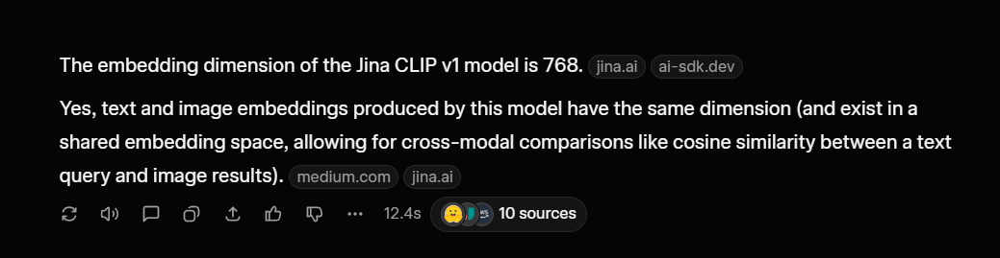

In [60]:
parent_docs, child_vectors = summarise_chunks(chunks)

NameError: name 'chunks' is not defined

In [18]:
def export_chunks_to_json(docs, filename="cache/chunks_export.json"):
    """Export parent documents (chunks) to clean JSON."""
    export_data = []

    for i, doc in enumerate(docs):
        chunk_data = {
            "chunk_id": i + 1,
            "content": doc.page_content,
            "metadata": {
                "original_content": json.loads(doc.metadata.get("original_content", "{}"))
            },
        }
        export_data.append(chunk_data)

    with open(filename, "w", encoding="utf-8") as f:
        json.dump(export_data, f, indent=2, ensure_ascii=False)

    print(f"✅ Exported {len(export_data)} chunks to {filename}")
    return export_data


In [39]:
json_data = export_chunks_to_json(parent_docs)


✅ Exported 263 chunks to cache/chunks_export.json


In [61]:
import uuid
from typing import List, Dict, Any

from langchain_community.vectorstores import Chroma
from langchain_core.stores import InMemoryStore
from langchain_core.documents import Document

In [62]:
from dotenv import load_dotenv
load_dotenv()

True

In [63]:
PINECONE_API_KEY = os.getenv("PINECONE_API_KEY")
os.environ["PINECONE_API_KEY"] = PINECONE_API_KEY

In [ ]:
from pinecone import Pinecone
from supabase import create_client, Client
from pinecone import ServerlessSpec 
pc = Pinecone(api_key=PINECONE_API_KEY)

In [20]:
pc

In [21]:
# We could have created a  pinecone index via website manually , but we are doing this through the code here 
from pinecone import ServerlessSpec 

index_name = "research-assistant"

if not pc.has_index(index_name):
    pc.create_index(
        name = index_name,
        dimension=768,  # Dimension of the embeddings
        metric= "cosine",  # Cosine similarity
        spec=ServerlessSpec(cloud="aws", region="us-east-1")
    )


index = pc.Index(index_name)

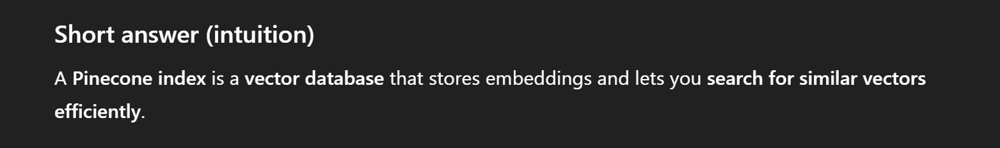

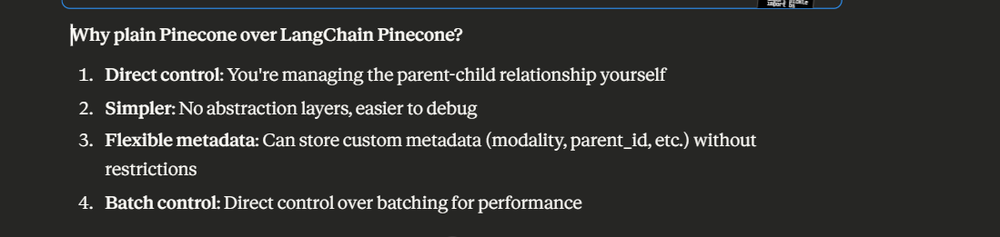

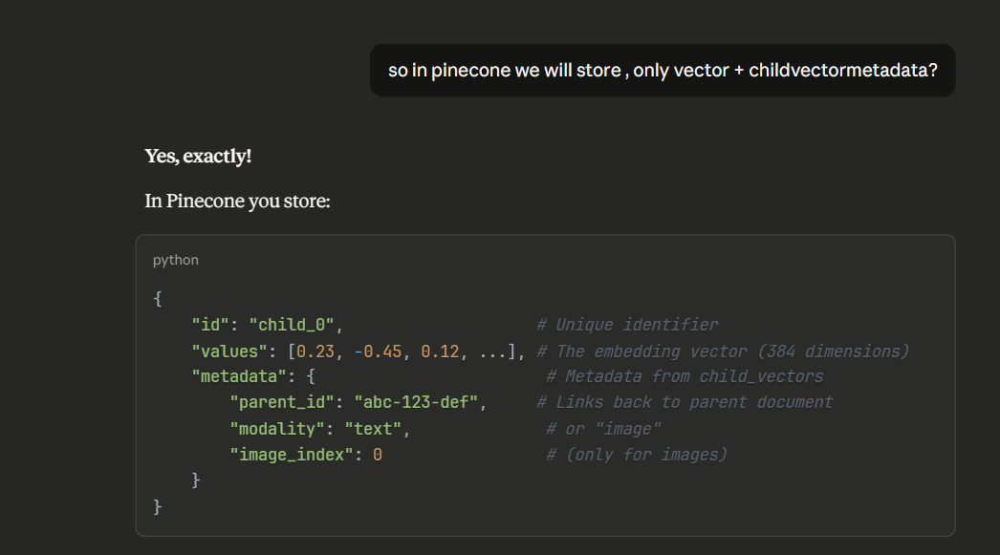

In [32]:
def store_child_vectors_pinecone(
    child_vectors: List[Dict[str, Any]],
    index_name: str = "research-assistant",
    dimension: int = 768,
):
    """Store only child vectors in Pinecone"""
    
    print("🔮 Storing child vectors in Pinecone...")
    
    # Prepare vectors
    vectors_to_upsert = []
    for i, cv in enumerate(child_vectors):
        vectors_to_upsert.append({
            "id": f"child_{i}",
            "values": cv["vector"],
            "metadata": cv["metadata"]
        })
    
    # Upsert in batches
    batch_size = 100
    total_batches = (len(vectors_to_upsert) + batch_size - 1) // batch_size
    
    for i in range(0, len(vectors_to_upsert), batch_size):
        batch = vectors_to_upsert[i:i + batch_size]
        index.upsert(vectors=batch)
        print(f"   ✓ Batch {i//batch_size + 1}/{total_batches}")
    
    # Verify
    stats = index.describe_index_stats()
    print(f"✅ Total vectors in Pinecone: {stats['total_vector_count']}")
    
    return index

In [33]:
# Usage
index = store_child_vectors_pinecone(
    child_vectors=child_vectors,
    index_name="research-assistant",
    dimension=768
)

🔮 Storing child vectors in Pinecone...
   ✓ Batch 1/4
   ✓ Batch 2/4
   ✓ Batch 3/4
   ✓ Batch 4/4
✅ Total vectors in Pinecone: 363


In [65]:
def load_pinecone_index(index_name: str = "research-assistant"):
    """Load existing Pinecone index"""
    
    print(f"📂 Loading Pinecone index: {index_name}")
    
    # Initialize Pinecone
    pc = Pinecone(api_key=os.environ.get("PINECONE_API_KEY"))
    
    # Check if index exists
    if not pc.has_index(index_name):
        raise ValueError(f"❌ Index '{index_name}' does not exist!")
    
    # Connect to index
    index = pc.Index(index_name)
    
    # Get stats
    stats = index.describe_index_stats()
    print(f"✅ Loaded index: {index_name}")
    print(f"   Total vectors: {stats['total_vector_count']}")
    print(f"   Dimension: {stats['dimension']}")
    
    return index


# Usage
index = load_pinecone_index("research-assistant")

📂 Loading Pinecone index: research-assistant
✅ Loaded index: research-assistant
   Total vectors: 363
   Dimension: 768


In [23]:
len(child_vectors)

NameError: name 'child_vectors' is not defined

In [38]:
len(parent_docs)

263

In [43]:
parent_docs[0]

Document(metadata={'parent_id': '5005a51b-006d-4990-8461-545972b051d1', 'original_content': '{"raw_text": "\\u00ae Check for updates\\n\\n| | ADVANCING EARTH AND > SPACE SCIENCES Y and AG\\n\\nGeophysical Research Letters\\u2019\\n\\nEh\\n\\nRESEARCH LETTER\\n\\n10.1029/2025GL117356\\n\\nSpecial Collection: Modeling of Geological Hazards in Complex Environments\\n\\nPhysics\\u2010Informed Deep Learning for Revealing the Evolutionary Characteristics of Landslides Induced by Rainfall Process\\n\\nChangdong Li1,2 , Pengfei Feng1 , Jie Meng1, Filippo Catani3 , Helge Hellevang4 , Huiming Tang1,2 , Xinshuang Sun1, and Dewei Huang1\\n\\nKey Points:\\n\\n\\u2022 Realizing end\\u2010to\\u2010end physical consis- tency for multi\\u2010physical fields collab- orative prediction by embedding physical mechanisms\\n\\n1Faculty of Engineering, China University of Geosciences, Wuhan, China, 2Badong National Observation and Research Station of Geohazards, China University of Geosciences, Wuhan, China, 

Let us store parent_docs also on cloud => SUPABASE -> Postgres

In [40]:
%pip install supabase

  Using cached deprecation-2.1.0-py2.py3-none-any.whl.metadata (4.6 kB)
  Using cached StrEnum-0.4.15-py3-none-any.whl.metadata (5.3 kB)
  Using cached PyJWT-2.10.1-py3-none-any.whl.metadata (4.0 kB)
  Using cached h2-4.3.0-py3-none-any.whl.metadata (5.1 kB)
  Using cached hyperframe-6.1.0-py3-none-any.whl.metadata (4.3 kB)
  Using cached hpack-4.1.0-py3-none-any.whl.metadata (4.6 kB)
  Using cached sortedcontainers-2.4.0-py2.py3-none-any.whl.metadata (10 kB)
  Using cached strictyaml-1.7.3-py3-none-any.whl.metadata (11 kB)
Using cached h2-4.3.0-py3-none-any.whl (61 kB)
Using cached hpack-4.1.0-py3-none-any.whl (34 kB)
Using cached hyperframe-6.1.0-py3-none-any.whl (13 kB)
Using cached deprecation-2.1.0-py2.py3-none-any.whl (11 kB)
   ---------------------------------------- 0.0/549.1 kB ? eta -:--:--
   ---------------------------------------- 0.0/549.1 kB ? eta -:--:--
   ---------------------------------------- 0.0/549.1 kB ? eta -:--:--
   ---------------------------------------- 0

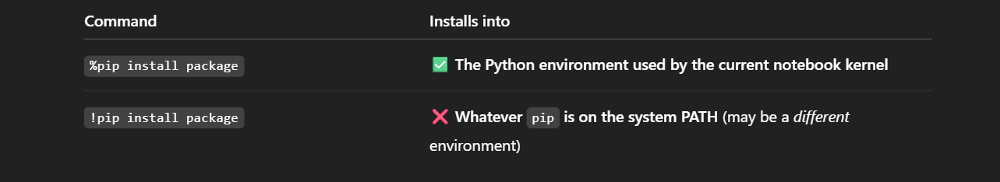

In [66]:
from supabase import create_client, Client
import json
import os

In [67]:
load_dotenv()

True

In [52]:
def store_parents_in_supabase(parent_documents: List[Document]):
    """Store parent documents in Supabase PostgreSQL"""
    
    print("💾 Storing parent documents in Supabase...")
    
    # Initialize Supabase client
    supabase: Client = create_client(
        os.environ["SUPABASE_URL"],
        os.environ["SUPABASE_KEY"]
    )
    
    # Prepare data for batch insert
    records = []
    for doc in parent_documents:
        records.append({
            "parent_id": doc.metadata["parent_id"],
            "content": doc.page_content,  # full_text (text + tables as text)
            "original_content": doc.metadata["original_content"]  # JSON string with raw_text, tables_html, images_base64
        })
    
    # Insert all records (upsert to handle duplicates)
    response = supabase.table('parent_documents').upsert(records).execute()
    
    print(f"✅ Stored {len(records)} parent documents in Supabase")
    return response

In [53]:
store_parents_in_supabase(parent_docs)

💾 Storing parent documents in Supabase...
✅ Stored 263 parent documents in Supabase


APIResponse(data=[{'parent_id': '5005a51b-006d-4990-8461-545972b051d1', 'content': '® Check for updates\n\n| | ADVANCING EARTH AND > SPACE SCIENCES Y and AG\n\nGeophysical Research Letters’\n\nEh\n\nRESEARCH LETTER\n\n10.1029/2025GL117356\n\nSpecial Collection: Modeling of Geological Hazards in Complex Environments\n\nPhysics‐Informed Deep Learning for Revealing the Evolutionary Characteristics of Landslides Induced by Rainfall Process\n\nChangdong Li1,2 , Pengfei Feng1 , Jie Meng1, Filippo Catani3 , Helge Hellevang4 , Huiming Tang1,2 , Xinshuang Sun1, and Dewei Huang1\n\nKey Points:\n\n• Realizing end‐to‐end physical consis- tency for multi‐physical fields collab- orative prediction by embedding physical mechanisms\n\n1Faculty of Engineering, China University of Geosciences, Wuhan, China, 2Badong National Observation and Research Station of Geohazards, China University of Geosciences, Wuhan, China, 3Department of Geosciences, University of Padova, Padova, Italy, 4Department of Geoscie

In [68]:
def load_parent_from_supabase(parent_id: str) -> Document:
    """Load a single parent document by parent_id"""
    
    supabase: Client = create_client(
        os.environ.get("SUPABASE_URL"),
        os.environ.get("SUPABASE_KEY")
    )
    
    # Query by parent_id
    result = supabase.table('parent_documents')\
        .select('*')\
        .eq('parent_id', parent_id)\
        .execute()
    
    if not result.data:
        return None
    
    row = result.data[0]
    
    # Reconstruct Document
    doc = Document(
        page_content=row['content'],  # fulltext= text + tables as text 
        metadata={
            "parent_id": row['parent_id'],
            "original_content": row['original_content']
        }
    )
    
    return doc

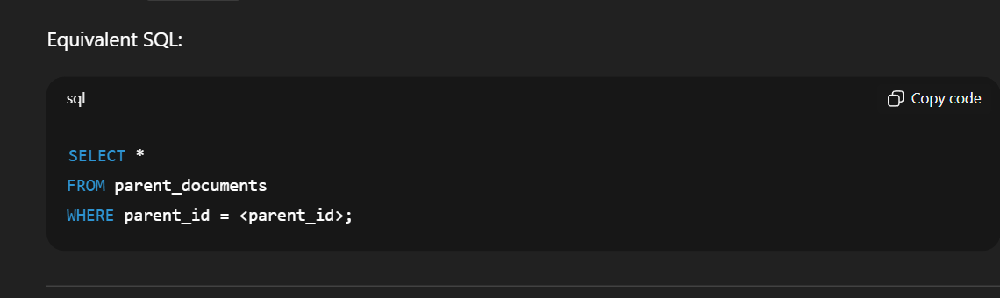

In [69]:
def load_multiple_parents_from_supabase(parent_ids: List[str]) -> List[Document]:
    """Load multiple parent documents by their IDs"""
    
    supabase: Client = create_client(
        os.environ.get("SUPABASE_URL"),
        os.environ.get("SUPABASE_KEY")
    )
    
    # Query multiple IDs
    result = supabase.table('parent_documents')\
        .select('*')\
        .in_('parent_id', parent_ids)\
        .execute()
    
    documents = []
    for row in result.data:
        doc = Document(
            page_content=row['content'],
            metadata={
                "parent_id": row['parent_id'],
                "original_content": row['original_content']
            }
        )
        documents.append(doc)
    
    return documents


In [70]:
# NEW: Helper to load all parent documents from Supabase (for BM25)
def load_all_parents_from_supabase() -> List[Document]:
    """Load all parent documents from Supabase for BM25 indexing."""
    print("📥 Loading all parent documents from Supabase...")
    
    supabase: Client = create_client(
        os.environ["SUPABASE_URL"],
        os.environ["SUPABASE_KEY"]
    )
    
    response = supabase.table('parent_documents').select('*').execute()
    
    if not response.data:
        raise ValueError("No parent documents found in Supabase.")
    
    parent_documents = []
    for row in response.data:
        doc = Document(
            page_content=row['content'],
            metadata={
                "parent_id": row['parent_id'],
                "original_content": row['original_content']
            }
        )
        parent_documents.append(doc)
    
    print(f"✅ Loaded {len(parent_documents)} parent documents")
    return parent_documents

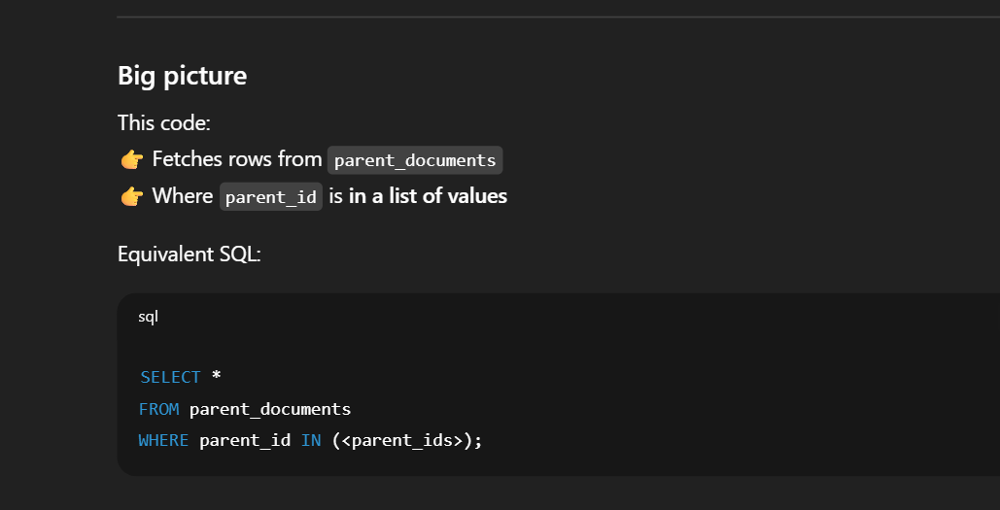

In [29]:
# Load single document
doc = load_parent_from_supabase("0127ebc8-4b37-4837-a295-788a9175ebcc")
doc.metadata

{'parent_id': '0127ebc8-4b37-4837-a295-788a9175ebcc',
 'original_content': '{"raw_text": "Acknowledgments\\n\\nThe research is supported by the National Natural Science Foundation of China (Grant 42090054), Fundamental and Interdisciplinary Disciplines Breakthrough Plan of the Ministry of Education of China (JYB2025XDXM911), and the Natural Science Foundation of Hubei Province of China (2022CFA002 and 2025AFB380).\\n\\nLI ET AL.\\n\\nGeophysical Research Letters\\n\\n10.1029/2025GL117356\\n\\noutput, performing a particularly important role in guiding stability prediction. For predicting the evolution of rainfall\\u2010induced slope failure, the pre\\u2010trained PMNN and fine\\u2010tuned PMNN frameworks effectively capture the dynamic coupling between unsaturated seepage and stress fields. Furthermore, visualization results demonstrate that the model can accurately predict the migration process of wetting front, while also showing the spatio- temporal evolution process of pore pressur

In [68]:
# Load multiple documents (for RAG retrieval)
parent_ids = ["0127ebc8-4b37-4837-a295-788a9175ebcc", "03e985d1-c11c-4af5-8382-d53c0a1d1f0d", "072ec062-5a35-4970-b9ba-7a3a87dde216"]
docs = load_multiple_parents_from_supabase(parent_ids)
print(f"Loaded {len(docs)} documents")
docs

Loaded 3 documents


[Document(metadata={'parent_id': '0127ebc8-4b37-4837-a295-788a9175ebcc', 'original_content': '{"raw_text": "Acknowledgments\\n\\nThe research is supported by the National Natural Science Foundation of China (Grant 42090054), Fundamental and Interdisciplinary Disciplines Breakthrough Plan of the Ministry of Education of China (JYB2025XDXM911), and the Natural Science Foundation of Hubei Province of China (2022CFA002 and 2025AFB380).\\n\\nLI ET AL.\\n\\nGeophysical Research Letters\\n\\n10.1029/2025GL117356\\n\\noutput, performing a particularly important role in guiding stability prediction. For predicting the evolution of rainfall\\u2010induced slope failure, the pre\\u2010trained PMNN and fine\\u2010tuned PMNN frameworks effectively capture the dynamic coupling between unsaturated seepage and stress fields. Furthermore, visualization results demonstrate that the model can accurately predict the migration process of wetting front, while also showing the spatio- temporal evolution proce

In [61]:
print("pariskar is done ")

pariskar is done 


In [67]:
print(8+2)

10


In [70]:
print(1)

1


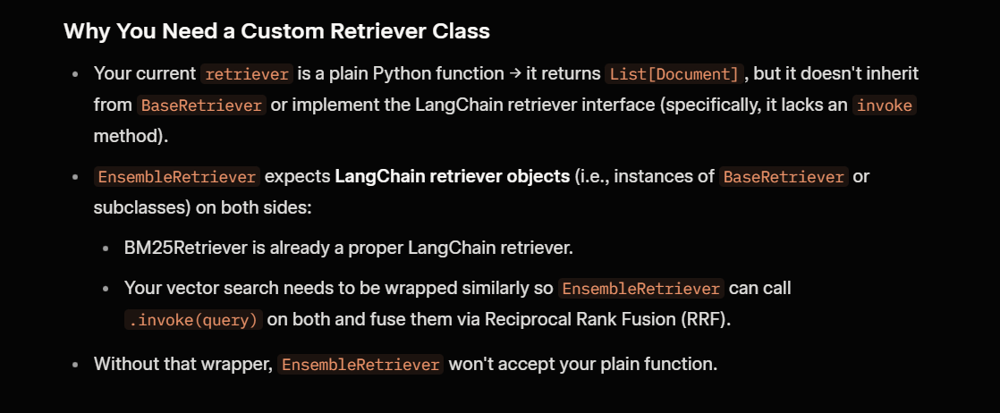

In [71]:
from langchain_core.retrievers import BaseRetriever
from langchain_core.documents import Document
from typing import List

In [ ]:
# pinecone bata normally retrieve garna this is okay and goood 
# But , when i want to use Ensemble retriver , it wants to inherit things from baseretriever class , so alli modify garni eslailaai 

# def retriever(
#     query: str,
#     index,  # ← Pinecone index
#     embed_text_with_clip,
#     k: int = 5,
# ) -> List[Document]:
#     """Query using Pinecone"""
    
#     # Embed query
#     q_vec = embed_text_with_clip(query)
    
#     # Convert to list if numpy
#     if hasattr(q_vec, 'tolist'):
#         q_vec = q_vec.tolist()
    
#     print(f"Query vector: {len(q_vec)}-dim")
#     print(f"Query sample: [{q_vec[0]:.4f}, {q_vec[1]:.4f}, ...]")
    
#     # ✅ Query Pinecone directly
#     results = index.query(
#         vector=q_vec,
#         top_k=k,
#         include_metadata=True
#     )
    
#     print(f"Pinecone returned {len(results['matches'])} results")
    
#     # Collect unique parent IDs
#     seen = set()
#     parent_ids = []

#     if 'matches' in results and len(results['matches']) > 0:
#         for match in results['matches']:
#             parent_id = match['metadata'].get("parent_id")
            
#             if parent_id and parent_id not in seen:
#                 parent_ids.append(parent_id)
#                 seen.add(parent_id)
    
#     # Load parents from Supabase in batch
#     parents: List[Document] = load_multiple_parents_from_supabase(parent_ids)
    
#     print(f"✅ Retrieved {len(parents)} unique parent documents")
#     return parents

In [ ]:
# # Custom retriever for Pinecone vector search
# class PineconeRetriever(BaseRetriever):
#     def __init__(
#         self,
#         index,
#         embed_text_with_clip,
#         load_multiple_parents_from_supabase,
#         k: int = 20,  # Retrieve more for fusion/reranking
#     ):
#         self.index = index
#         self.embed_text_with_clip = embed_text_with_clip
#         self.load_multiple_parents_from_supabase = load_multiple_parents_from_supabase
#         self.k = k

#     def _get_relevant_documents(self, query: str) -> List[Document]:
#         print(f"🔍 Vector search: '{query}'")
        
#         q_vec = self.embed_text_with_clip(query)
#         if hasattr(q_vec, 'tolist'):
#             q_vec = q_vec.tolist()
        
#         results = self.index.query(
#             vector=q_vec,
#             top_k=self.k,
#             include_metadata=True
#         )
        
#         # Collect unique parent IDs
#         seen = set()
#         parent_ids = []
#         if 'matches' in results:
#             for match in results['matches']:
#                 pid = match['metadata'].get("parent_id")
#                 if pid and pid not in seen:
#                     parent_ids.append(pid)
#                     seen.add(pid)
        
#         # Load unique parents
#         parents = self.load_multiple_parents_from_supabase(parent_ids)
#         print(f"✅ Vector retrieved {len(parents)} unique parents")
#         return parents

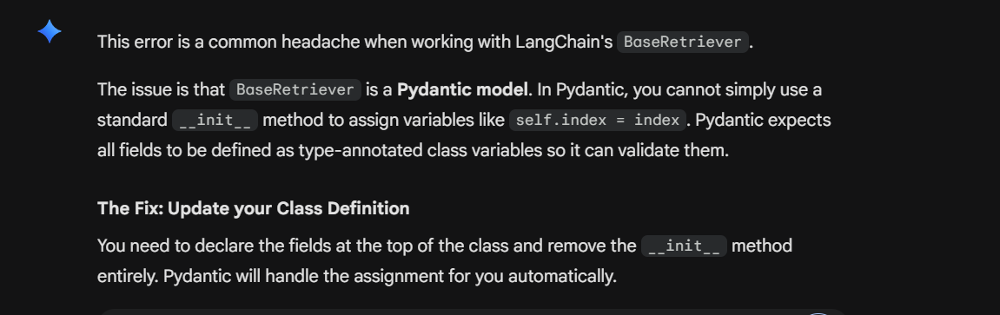

In [82]:
from typing import Any, Callable, List
from langchain_core.retrievers import BaseRetriever
from langchain_core.documents import Document

class PineconeRetriever(BaseRetriever):
    # Declare your fields here with type hints
    index: Any
    embed_text_with_clip: Callable
    load_multiple_parents_from_supabase: Callable
    k: int = 20

    def _get_relevant_documents(self, query: str) -> List[Document]:
        print(f"🔍 Vector search: '{query}'")
        
        # Access variables using self.fieldname as usual
        q_vec = self.embed_text_with_clip(query)
        if hasattr(q_vec, 'tolist'):
            q_vec = q_vec.tolist()
        
        results = self.index.query(
            vector=q_vec,
            top_k=self.k,
            include_metadata=True
        )
        
        seen = set()
        parent_ids = []
        if 'matches' in results:
            for match in results['matches']:
                pid = match['metadata'].get("parent_id")
                if pid and pid not in seen:
                    parent_ids.append(pid)
                    seen.add(pid)
        
        parents = self.load_multiple_parents_from_supabase(parent_ids)
        print(f"✅ Vector retrieved {len(parents)} unique parents")
        return parents

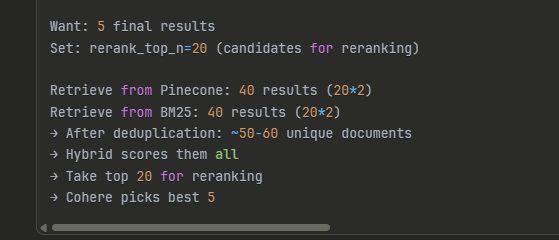

In [1]:
# our case : rerank_top_n = 10  


In [2]:
# Cell 1: Uninstall
%pip uninstall -y langchain langchain-core langchain-community langchain-cohere

Note: you may need to restart the kernel to use updated packages.


In [1]:
%langchain-community  

UsageError: Line magic function `%langchain-community` not found.


In [22]:
%pip install langchain-cohere

Note: you may need to restart the kernel to use updated packages.


In [10]:
%pip install langchain==0.3.13

  Using cached langchain_core-0.3.83-py3-none-any.whl.metadata (3.2 kB)
INFO: pip is looking at multiple versions of langchain-core to determine which version is compatible with other requirements. This could take a while.
  Using cached langchain_core-0.3.82-py3-none-any.whl.metadata (3.2 kB)
  Using cached langchain_core-0.3.81-py3-none-any.whl.metadata (3.2 kB)
  Using cached langchain_core-0.3.80-py3-none-any.whl.metadata (3.2 kB)
  Using cached langchain_core-0.3.79-py3-none-any.whl.metadata (3.2 kB)
  Using cached langchain_core-0.3.78-py3-none-any.whl.metadata (3.2 kB)
  Using cached langchain_core-0.3.77-py3-none-any.whl.metadata (3.2 kB)
  Using cached langchain_core-0.3.76-py3-none-any.whl.metadata (3.7 kB)
INFO: pip is still looking at multiple versions of langchain-core to determine which version is compatible with other requirements. This could take a while.
  Using cached langchain_core-0.3.75-py3-none-any.whl.metadata (5.7 kB)
  Using cached langchain_core-0.3.74-py3-non

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
langchain-chroma 1.1.0 requires langchain-core<2.0.0,>=1.1.3, but you have langchain-core 0.3.63 which is incompatible.
langchain-classic 1.0.1 requires langchain-core<2.0.0,>=1.2.5, but you have langchain-core 0.3.63 which is incompatible.
langchain-classic 1.0.1 requires langchain-text-splitters<2.0.0,>=1.1.0, but you have langchain-text-splitters 0.3.8 which is incompatible.
langchain-huggingface 1.2.0 requires langchain-core<2.0.0,>=1.2.0, but you have langchain-core 0.3.63 which is incompatible.
langchain-openai 0.3.35 requires langchain-core<1.0.0,>=0.3.78, but you have langchain-core 0.3.63 which is incompatible.
langchain-tests 0.3.22 requires langchain-core<2.0.0,>=0.3.77, but you have langchain-core 0.3.63 which is incompatible.
langgraph-prebuilt 1.0.5 requires langchain-core>=1.0.0, but you have langch

In [9]:
%pip install langchain-core==0.3.29

  Using cached langchain_core-0.3.29-py3-none-any.whl.metadata (6.3 kB)
  Attempting uninstall: langchain-core
    Found existing installation: langchain-core 0.3.63
    Uninstalling langchain-core-0.3.63:
      Successfully uninstalled langchain-core-0.3.63
Note: you may need to restart the kernel to use updated packages.


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
langchain 0.3.25 requires langchain-core<1.0.0,>=0.3.58, but you have langchain-core 0.3.29 which is incompatible.
langchain-chroma 1.1.0 requires langchain-core<2.0.0,>=1.1.3, but you have langchain-core 0.3.29 which is incompatible.
langchain-classic 1.0.1 requires langchain-core<2.0.0,>=1.2.5, but you have langchain-core 0.3.29 which is incompatible.
langchain-classic 1.0.1 requires langchain-text-splitters<2.0.0,>=1.1.0, but you have langchain-text-splitters 0.3.8 which is incompatible.
langchain-huggingface 1.2.0 requires langchain-core<2.0.0,>=1.2.0, but you have langchain-core 0.3.29 which is incompatible.
langchain-openai 0.3.35 requires langchain-core<1.0.0,>=0.3.78, but you have langchain-core 0.3.29 which is incompatible.
langchain-pinecone 0.2.8 requires langchain-core<1.0.0,>=0.3.34, but you have lang

In [8]:
# Cell 1: Install packages (run this first)
%pip install langchain_community==0.3.13

  Using cached langchain_community-0.3.13-py3-none-any.whl.metadata (2.9 kB)
  Using cached langchain_core-0.3.83-py3-none-any.whl.metadata (3.2 kB)
  Using cached langchain_text_splitters-0.3.11-py3-none-any.whl.metadata (1.8 kB)
INFO: pip is looking at multiple versions of langchain-core to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of langchain-core to determine which version is compatible with other requirements. This could take a while.
  Using cached langchain-0.3.26-py3-none-any.whl.metadata (7.8 kB)
INFO: This is taking longer than usual. You might need to provide the dependency resolver with stricter constraints to reduce runtime. See https://pip.pypa.io/warnings/backtracking for guidance. If you want to abort this run, press Ctrl + C.
   ---------------------------------------- 0.0/2.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/2.5 MB ? eta -:--:--
   ---- ------

  You can safely remove it manually.
  You can safely remove it manually.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
langchain-chroma 1.1.0 requires langchain-core<2.0.0,>=1.1.3, but you have langchain-core 0.3.63 which is incompatible.
langchain-classic 1.0.1 requires langchain-core<2.0.0,>=1.2.5, but you have langchain-core 0.3.63 which is incompatible.
langchain-classic 1.0.1 requires langchain-text-splitters<2.0.0,>=1.1.0, but you have langchain-text-splitters 0.3.8 which is incompatible.
langchain-huggingface 1.2.0 requires langchain-core<2.0.0,>=1.2.0, but you have langchain-core 0.3.63 which is incompatible.
langchain-openai 0.3.35 requires langchain-core<1.0.0,>=0.3.78, but you have langchain-core 0.3.63 which is incompatible.
langchain-tests 0.3.22 requires langchain-core<2.0.0,>=0.3.77, but you have langchain-core 0.3.63 which is incompatible.
la

In [14]:
from langchain_core.retrievers import BaseRetriever

In [15]:
from langchain_community.retrievers import BM25Retriever

In [20]:
from langchain.retrievers.ensemble import EnsembleRetriever

In [ ]:
# (from versions:
#  0.1.0rc0, 0.1.0rc1, 0.1.0, 0.1.1rc0, 0.1.1, 0.1.2, 0.1.3rc0, 0.1.3rc1, 0.1.3, 0.1.4rc0, 0.1.4rc1, 0.1.4, 0.1.5, 0.1.7, 0.1.8, 0.1.9, 0.2.0, 
# 0.2.1rc0, 0.2.1, 0.2.2, 0.2.3, 0.2.4, 0.3.0.dev2, 0.3.0, 0.3.1, 0.3.2, 0.3.3, 0.3.4, 0.3.5, 0.4.1, 0.4.2, 0.4.3, 0.4.4, 0.4.5, 0.4.6, 0.5.0) 
# ERROR: No matching distribution found for langchain_cohere==0.3.8
# these are available version fo langchain_cohere 

In [39]:
%pip install langchain-cohere==0.3.5

  Using cached langchain_cohere-0.3.5-py3-none-any.whl.metadata (6.7 kB)
  Using cached langchain_core-0.3.83-py3-none-any.whl.metadata (3.2 kB)
INFO: pip is looking at multiple versions of langchain to determine which version is compatible with other requirements. This could take a while.
  Using cached langchain-1.2.0-py3-none-any.whl.metadata (4.9 kB)
INFO: pip is still looking at multiple versions of langchain to determine which version is compatible with other requirements. This could take a while.
INFO: This is taking longer than usual. You might need to provide the dependency resolver with stricter constraints to reduce runtime. See https://pip.pypa.io/warnings/backtracking for guidance. If you want to abort this run, press Ctrl + C.
  Using cached langchain-0.3.27-py3-none-any.whl.metadata (7.8 kB)
  Using cached langchain_text_splitters-0.3.11-py3-none-any.whl.metadata (1.8 kB)
Using cached langchain_cohere-0.3.5-py3-none-any.whl (45 kB)
Using cached langchain_core-0.3.83-py3-

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
langchain-chroma 1.1.0 requires langchain-core<2.0.0,>=1.1.3, but you have langchain-core 0.3.83 which is incompatible.
langchain-classic 1.0.1 requires langchain-core<2.0.0,>=1.2.5, but you have langchain-core 0.3.83 which is incompatible.
langchain-classic 1.0.1 requires langchain-text-splitters<2.0.0,>=1.1.0, but you have langchain-text-splitters 0.3.11 which is incompatible.
langchain-huggingface 1.2.0 requires langchain-core<2.0.0,>=1.2.0, but you have langchain-core 0.3.83 which is incompatible.
langgraph-prebuilt 1.0.5 requires langchain-core>=1.0.0, but you have langchain-core 0.3.83 which is incompatible.


In [40]:
from langchain_cohere import CohereRerank 

In [73]:
# Cell 3: Verify imports
from langchain_community.retrievers import BM25Retriever
from langchain.retrievers.ensemble import EnsembleRetriever
from langchain_core.retrievers import BaseRetriever
from langchain_core.documents import Document
from langchain_cohere import CohereRerank
from typing import List, Dict, Any
import os
from supabase import create_client, Client
import json

In [83]:
# Cell 3: Verify imports
from langchain_community.retrievers import BM25Retriever
from langchain.retrievers.ensemble import EnsembleRetriever
from langchain_core.retrievers import BaseRetriever
from langchain_core.documents import Document
# from langchain_cohere import CohereRerank
from typing import List, Dict, Any
import os
from supabase import create_client, Client
import json

print("✅ All imports successful!")
# Final hybrid retrieval function with Cohere reranking
def retrieve_parent_docs_hybrid(
    query: str,
    index,  # Pinecone index
    embed_text_with_clip,
    load_multiple_parents_from_supabase,  # Pass this function
    cohere_api_key: str,  # Required for Cohere reranking
    k: int = 5,
    rerank_top_n: int = 20,  # Initial retrieve per retriever, then fuse, then rerank top N
    vector_weight: float = 0.7,
    bm25_weight: float = 0.3,
    rerank_model: str = "rerank-english-v3.0",  # Cohere model
) -> List[Document]:
    """Hybrid retrieval: Vector (Pinecone) + BM25 → RRF Fusion via EnsembleRetriever → Cohere Rerank → Top K
    
    Note: For large corpora, consider caching parent_documents globally instead of loading every time.
    Requires Cohere API key for reranking.
    """
    
    print(f"🔍 Hybrid search: '{query}'")
    
    # Load all parents for BM25 (cache this if possible)
    parent_documents = load_all_parents_from_supabase()
    
    # Setup BM25 retriever
    bm25_retriever = BM25Retriever.from_documents(parent_documents)
    bm25_retriever.k = rerank_top_n
    
    # Setup vector retriever
    vector_retriever = PineconeRetriever(
        index=index,
        embed_text_with_clip=embed_text_with_clip,
        load_multiple_parents_from_supabase=load_multiple_parents_from_supabase,
        k=rerank_top_n,
    )
    
    # Hybrid via Ensemble (uses RRF internally)
    hybrid_retriever = EnsembleRetriever(
        retrievers=[vector_retriever, bm25_retriever],
        weights=[vector_weight, bm25_weight]
    )
    
    # Get fused candidates
    candidate_docs = hybrid_retriever.invoke(query)
    # after rrf pani , this candidate_docs contains all the chunks ,not top 25 ranking chunks , it orders and ranks through rrf internally 
    # but still returns all the candidates it found from both retrievers
    candidate_docs = candidate_docs[:20]  # take top 20 candidates for reranking
    print(f"📊 Hybrid retrieved {len(candidate_docs)} candidates")
    
    # Cohere reranking
    print("🎯 Reranking with Cohere...")
    cohere_reranker = CohereRerank(
        cohere_api_key=cohere_api_key,
        model=rerank_model,
        top_n=k   # k=5
    )
    reranked_docs = cohere_reranker.compress_documents(
        documents=candidate_docs,
        query=query
    )
    print(f"✅ Returned top {len(reranked_docs)} after reranking")
    return reranked_docs

✅ All imports successful!


In [ ]:
# query = "How many hidden layers and neurons does the neural network use in this landslide PINN model?"


# chunks = retrieve_parent_docs(
#     query=query,
#     index=index,
#     embed_text_with_clip=embed_text_with_clip,
#     k=5,
# )

Query vector: 768-dim
Query sample: [0.0020, 0.0031, ...]
Pinecone returned 5 results
✅ Retrieved 5 unique parent documents


In [75]:
from dotenv import load_dotenv
load_dotenv()

True

In [77]:
%pip install rank_bm25

Note: you may need to restart the kernel to use updated packages.


In [84]:
# Sample query
query = "How many hidden layers and neurons does the neural network use in this landslide PINN model?"  # Example from your earlier test

COHERE_API_KEY = os.getenv("COHERE_API_KEY")
# Call the hybrid retriever
# Note: embed_text_with_clip and load_multiple_parents_from_supabase must be defined/implemented.
chunks = retrieve_parent_docs_hybrid(
    query=query,
    index=index,
    embed_text_with_clip=embed_text_with_clip,  # Your CLIP text embedding function
    load_multiple_parents_from_supabase=load_multiple_parents_from_supabase,  # Your Supabase batch load function
    cohere_api_key=COHERE_API_KEY,
    k=5,  # Final top K after reranking
    rerank_top_n=20,  # Initial fetch per retriever
    vector_weight=0.7,
    bm25_weight=0.3,
    rerank_model="rerank-english-v3.0"
)

🔍 Hybrid search: 'How many hidden layers and neurons does the neural network use in this landslide PINN model?'
📥 Loading all parent documents from Supabase...
✅ Loaded 263 parent documents
🔍 Vector search: 'How many hidden layers and neurons does the neural network use in this landslide PINN model?'
✅ Vector retrieved 20 unique parents
📊 Hybrid retrieved 20 candidates
🎯 Reranking with Cohere...
✅ Returned top 5 after reranking


In [85]:
chunks

[Document(metadata={'parent_id': 'e6e835f7-552e-44b5-9d33-7bf12b0bae29', 'original_content': '{"raw_text": "2.2 Physics-informed neural network\\n\\nA neural network for a two-dimensional longitudinal section of the Pianello hillslope, \\ud835\\udf13\\ud835\\udf03(\\ud835\\udc65,\\ud835\\udc66,\\ud835\\udc61), is constructed with four hidden layers, each containing 150 neurons and nonlinear activation functions. The loss function combines the following contributions (Raissi et al. 2019; Karniadakis et al. 2021; Cuomo et al. 2022):\\n\\n\\u2022 Physics loss: penalizing deviations from the diffusion equation residuals,\\n\\n\\u2112\\ud835\\udc43\\ud835\\udc37\\ud835\\udc38 = ||\\ud835\\udf15\\ud835\\udc61\\ud835\\udf13\\ud835\\udf03 \\u2212 \\ud835\\udc37 \\u22072\\ud835\\udf13\\ud835\\udf03|| 2 , (3)\\n\\n\\u2022 Initial and boundary conditions: enforcing observed or prescribed conditions at the slope surface, boundaries, and initial state\\n\\nPomarico D., Lorusso G., Pantaleo E., Cill

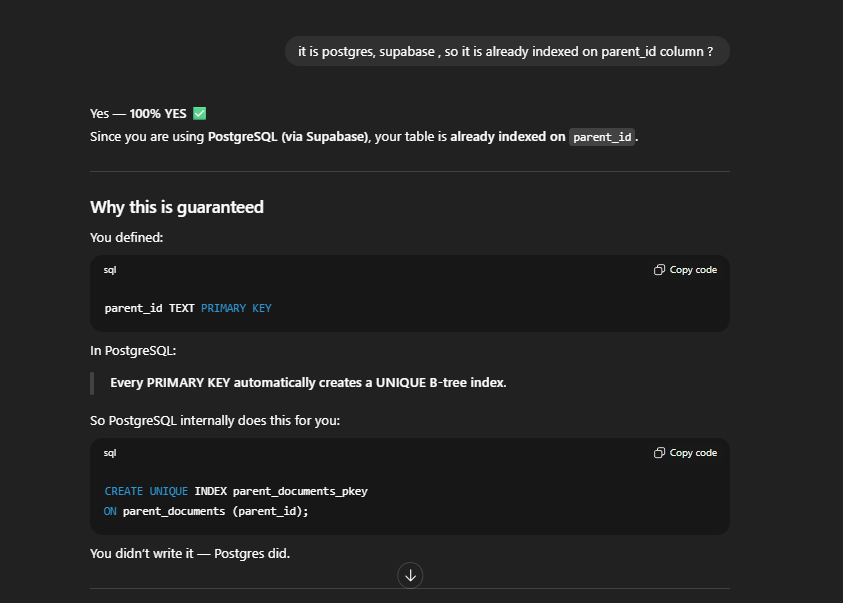

In [114]:
json.loads(chunks[3].metadata['original_content'])['images_base64']

['/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCALBBL0DASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvAVYnLRChYkNOEl8RcYGRomJygpKjU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6goOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4uPk5ebn6Onq8vP09fb3+Pn6/9oADAMBAAIRAxEAPwD36iiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigA

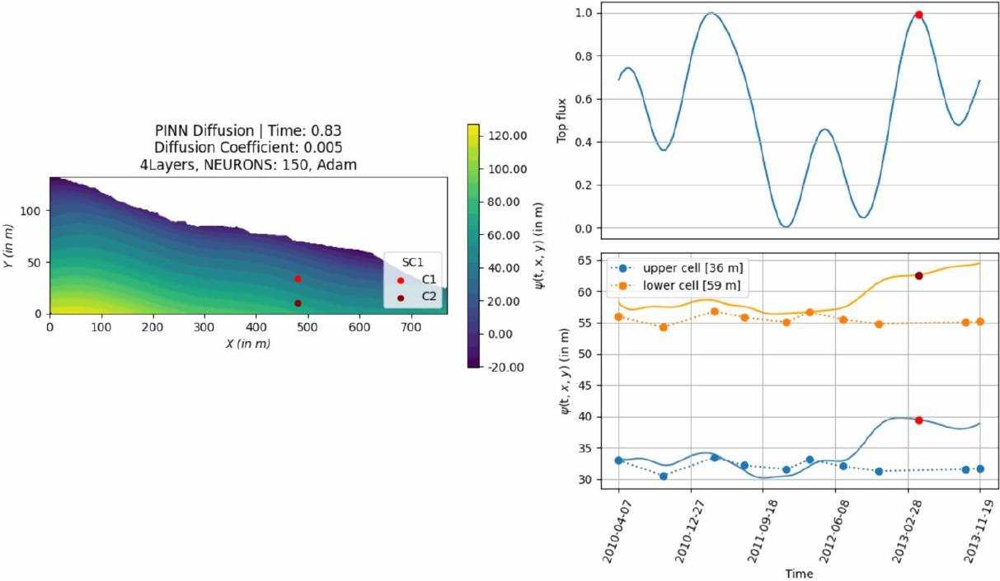

In [94]:
import base64
from PIL import Image
from io import BytesIO
import json

# get base64 string
b64_str = json.loads(chunks[0].metadata['original_content'])['images_base64']

# if it's a list, take first image
if isinstance(b64_str, list):
    b64_str = b64_str[0]

# decode base64 → bytes
image_bytes = base64.b64decode(b64_str)

# bytes → image
img = Image.open(BytesIO(image_bytes))

# display
display(img)


In [86]:
json.loads(chunks[0].metadata['original_content'])

{'raw_text': '2.2 Physics-informed neural network\n\nA neural network for a two-dimensional longitudinal section of the Pianello hillslope, 𝜓𝜃(𝑥,𝑦,𝑡), is constructed with four hidden layers, each containing 150 neurons and nonlinear activation functions. The loss function combines the following contributions (Raissi et al. 2019; Karniadakis et al. 2021; Cuomo et al. 2022):\n\n• Physics loss: penalizing deviations from the diffusion equation residuals,\n\nℒ𝑃𝐷𝐸 = ||𝜕𝑡𝜓𝜃 − 𝐷 ∇2𝜓𝜃|| 2 , (3)\n\n• Initial and boundary conditions: enforcing observed or prescribed conditions at the slope surface, boundaries, and initial state\n\nPomarico D., Lorusso G., Pantaleo E., Cilli R., Losacco N., Monaco A., Amoroso N., Bellantuono L., Esposito F., Del Buono N., Cotecchia F., Bellotti R. A Physics-Informed Approach to model soil-atmosphere interaction in slopes affected by slow-moving landslides.\n\nProc. of the 3rd Workshop on the Future of Machine Learning in Geotechnics (3FOMLIG) Florence (Italy), Oc

In [87]:
len(json.loads(chunks[0].metadata['original_content'])['images_base64'])

1

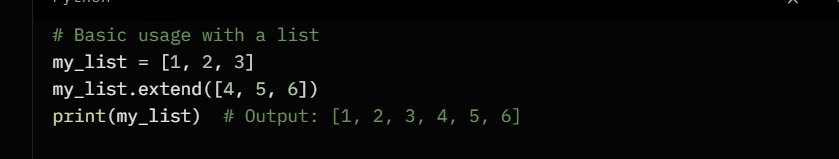

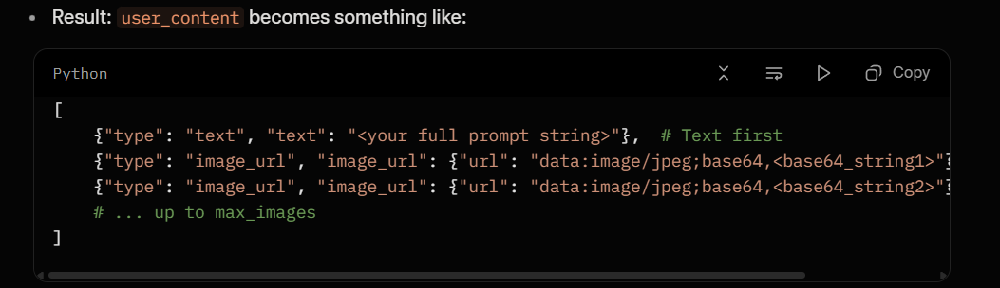

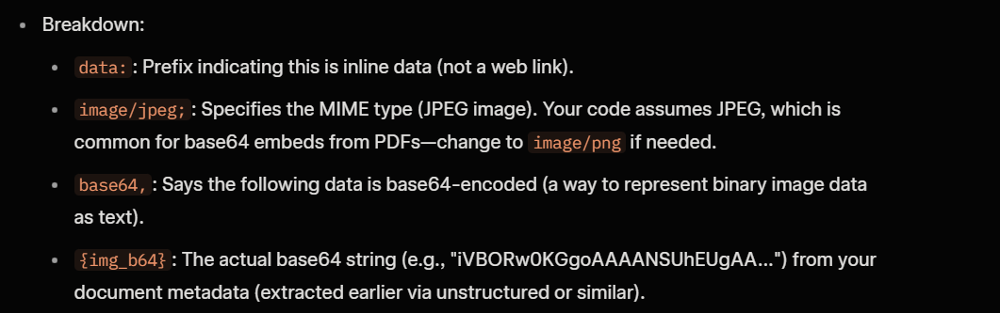

In [89]:
import json
import os
from typing import List
from langchain_core.documents import Document
from groq import Groq


def generate_final_answer_with_groq(
    chunks: List[Document],
    query: str,
    text_model: str = "llama-3.3-70b-versatile",
    vision_model: str = "meta-llama/llama-4-scout-17b-16e-instruct",
    temperature: float = 0.2,
    max_tokens: int = 1024,
    max_images: int = 5,
) -> str:
    """Route to text or vision model depending on whether images are present."""

    context_parts = []
    all_images = []

    # Build context and collect images
    for i, chunk in enumerate(chunks):
        part = [f"--- Document {i+1} ---"]

        original_json = chunk.metadata.get("original_content")
        if original_json:
            original_data = json.loads(original_json)

            raw_text = original_data.get("raw_text", "")
            if raw_text:
                part.append("TEXT:")
                part.append(raw_text)

            tables_html = original_data.get("tables_html", []) or []
            if tables_html:
                part.append("TABLES (HTML):")
                part.extend(tables_html)

            images = original_data.get("images_base64", []) or []
            all_images.extend(images)
        else:
            part.append(chunk.page_content)

        context_parts.append("\n".join(part))

    context_text = "\n\n".join(context_parts)

    base_instructions = """Use only the information from these documents.
If the documents don't contain enough information to answer, say:
"I don't have enough information to answer that question based on the provided documents."
Be precise and concise, and reference key details from the text/tables/images when needed.
"""

    client = Groq(api_key=os.getenv("GROQ_API_KEY"))

    # Case 1: no images -> pure text model
    if not all_images:
        combined_input = f"""Based on the following documents, please answer this question.

Question:
{query}

Documents:
{context_text}

Instructions:
{base_instructions}
"""
        messages = [
            {
                "role": "system",
                "content": "You are a helpful assistant that answers strictly based on the provided documents.",
            },
            {
                "role": "user",
                "content": combined_input,
            },
        ]
        model = text_model

    # Case 2: images present -> vision model with multimodal message
    else:
        prompt = f"""You are a helpful assistant that must answer based ONLY on the documents, tables, and images.

Question:
{query}

Documents:
{context_text}

Instructions:
{base_instructions}
"""
        user_content = [{"type": "text", "text": prompt}]
        for img_b64 in all_images[:max_images]:
            user_content.append(
                {
                    "type": "image_url",
                    "image_url": {"url": f"data:image/jpeg;base64,{img_b64}"},
                }
            )

        messages = [
            {
                "role": "system",
                "content": "You answer strictly based on the provided documents, tables, and images.",
            },
            {
                "role": "user",
                "content": user_content,
            },
        ]
        model = vision_model

    try:
        response = client.chat.completions.create(
            messages=messages,
            model=model,
            temperature=temperature,
            max_tokens=max_tokens,
        )
        return response.choices[0].message.content
    except Exception as e:
        print(f"❌ Groq answer generation failed: {e}")
        return "Sorry, I encountered an error while generating the answer."


In [90]:
from dotenv import load_dotenv
load_dotenv()  # must be called before Groq(...)
answer = generate_final_answer_with_groq(chunks, query)
print("\n=== ANSWER ===")
print(answer)


=== ANSWER ===
The neural network used in this landslide PINN model has **four hidden layers**, each containing **150 neurons**. This information is directly stated in Document 1 and visually confirmed in the provided image, which includes the text "4Layers, NEURONS: 150".
